In [2]:
import sys
sys.path.append('c://users/melvi/appdata/local/programs/python/python36/lib/site-packages')
import wordcloud
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle



In [3]:
conn = sqlite3.connect('final.sqlite')
c=conn.cursor()
conn.text_factory = str
final=pd.read_sql_query(""" SELECT * FROM Reviews  """, conn) 

In [4]:
final.to_sql('Reviews', conn,  schema=None, if_exists='replace', index=True, index_label=None, chunksize=None, dtype=None)
# Sorting data based on time
final["Time"] = pd.to_datetime(final["Time"], unit = "s")
final= final.sort_values(by = "Time")

In [5]:
x = final['CleanedText'].values

In [6]:
count_vect = CountVectorizer(min_df = 1000) 
data = count_vect.fit_transform(x)


In [9]:
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(n_clusters=2).fit(data.toarray())

reviews = final['Text'].values
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    else :
        cluster2.append(reviews[i])
 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))

No. of reviews in Cluster-1 :  3933

No. of reviews in Cluster-2 :  1053


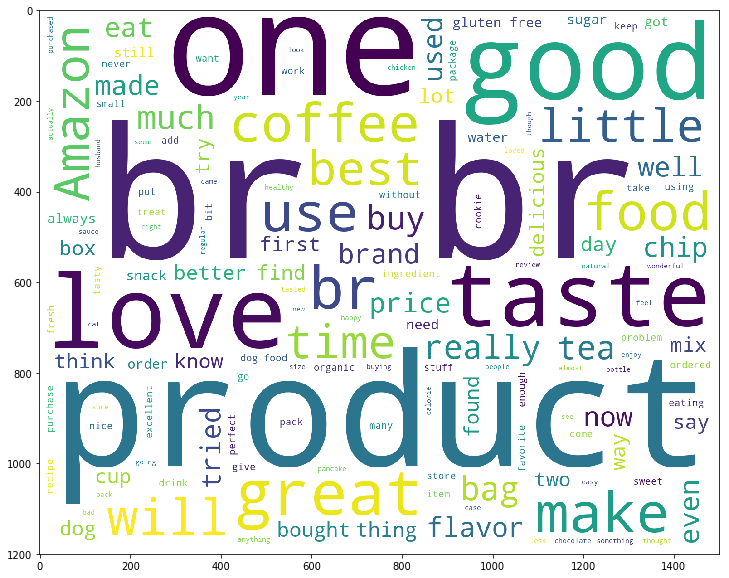

In [11]:
from wordcloud import WordCloud
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)


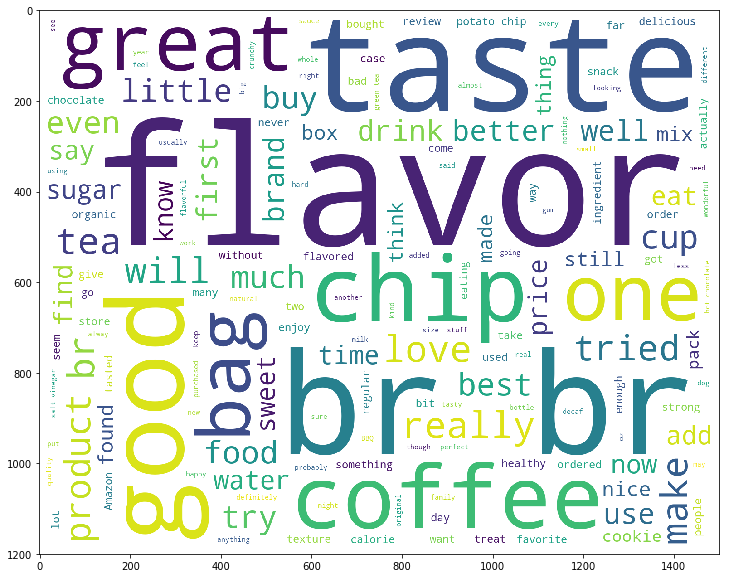

In [12]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [13]:
model = AgglomerativeClustering(n_clusters=5).fit(data.toarray())

# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    else :
        cluster5.append(reviews[i]) 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5))

No. of reviews in Cluster-1 :  2832

No. of reviews in Cluster-2 :  355

No. of reviews in Cluster-3 :  666

No. of reviews in Cluster-4 :  698

No. of reviews in Cluster-5 :  435


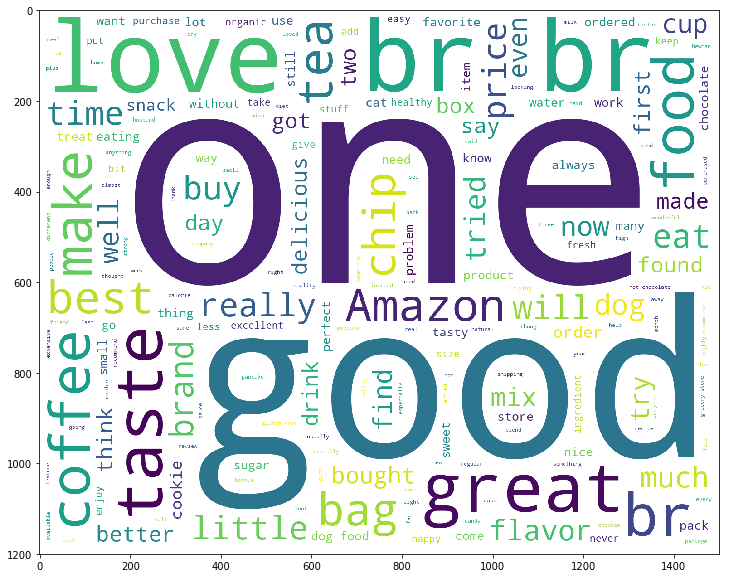

In [14]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

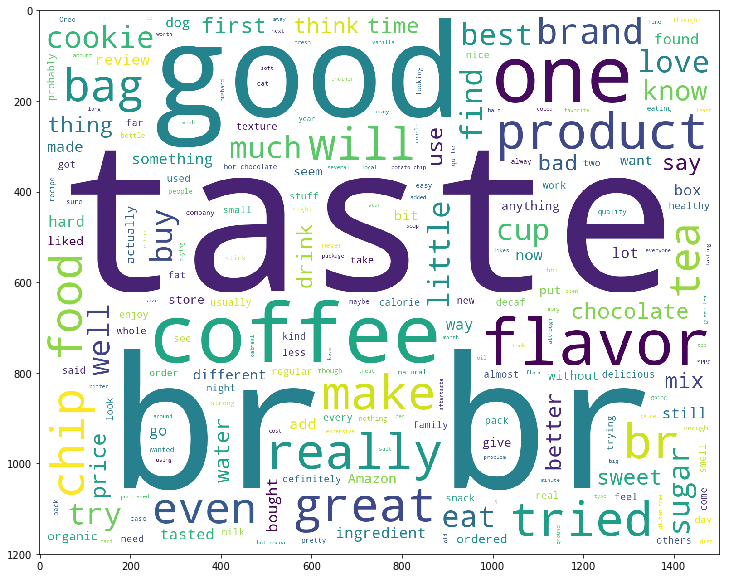

In [15]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

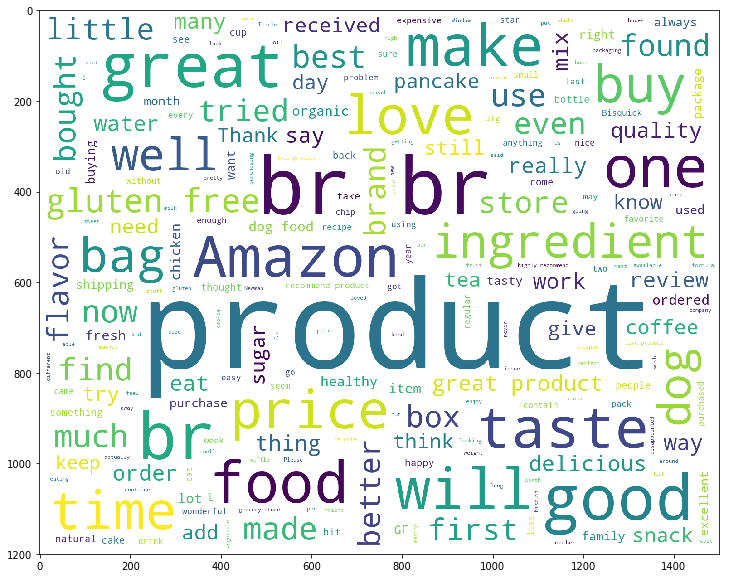

In [16]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

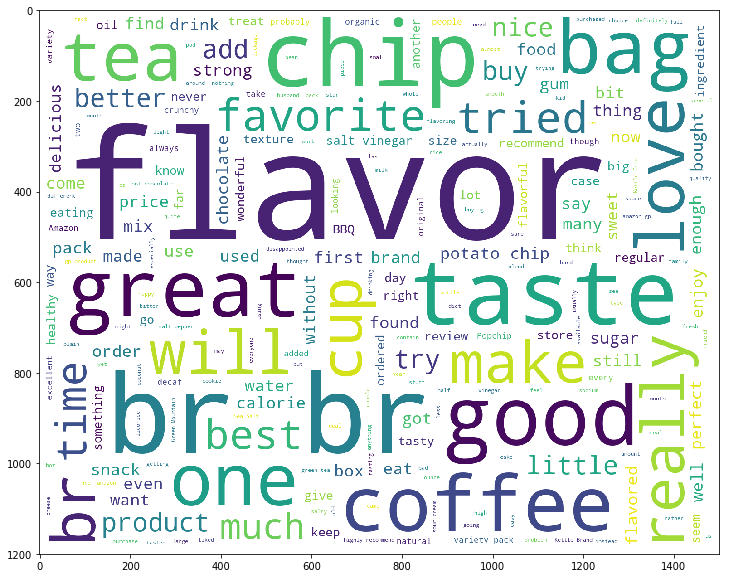

In [17]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

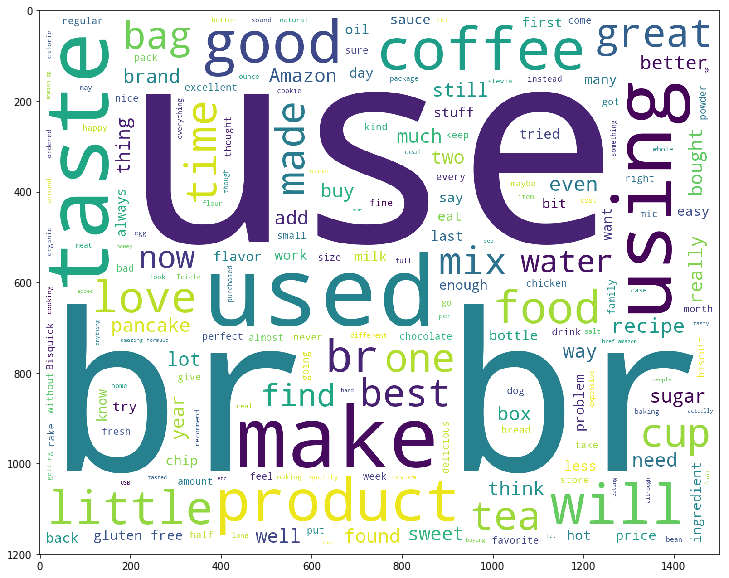

In [18]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [19]:
model = AgglomerativeClustering(n_clusters=10).fit(data.toarray())
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []
cluster10 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    elif model.labels_[i] == 4:
        cluster5.append(reviews[i])
    elif model.labels_[i] == 5:
        cluster6.append(reviews[i])
    elif model.labels_[i] == 6:
        cluster7.append(reviews[i])
    elif model.labels_[i] == 7:
        cluster8.append(reviews[i])
    elif model.labels_[i] == 8:
        cluster9.append(reviews[i])       
    else :
        cluster10.append(reviews[i])

In [20]:
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5)) 
print("\nNo. of reviews in Cluster-6 : ",len(cluster6))
print("\nNo. of reviews in Cluster-7 : ",len(cluster7))
print("\nNo. of reviews in Cluster-8 : ",len(cluster8))
print("\nNo. of reviews in Cluster-9 : ",len(cluster9))
print("\nNo. of reviews in Cluster-10 : ",len(cluster10))

No. of reviews in Cluster-1 :  1918

No. of reviews in Cluster-2 :  435

No. of reviews in Cluster-3 :  458

No. of reviews in Cluster-4 :  145

No. of reviews in Cluster-5 :  647

No. of reviews in Cluster-6 :  671

No. of reviews in Cluster-7 :  210

No. of reviews in Cluster-8 :  456

No. of reviews in Cluster-9 :  27

No. of reviews in Cluster-10 :  19


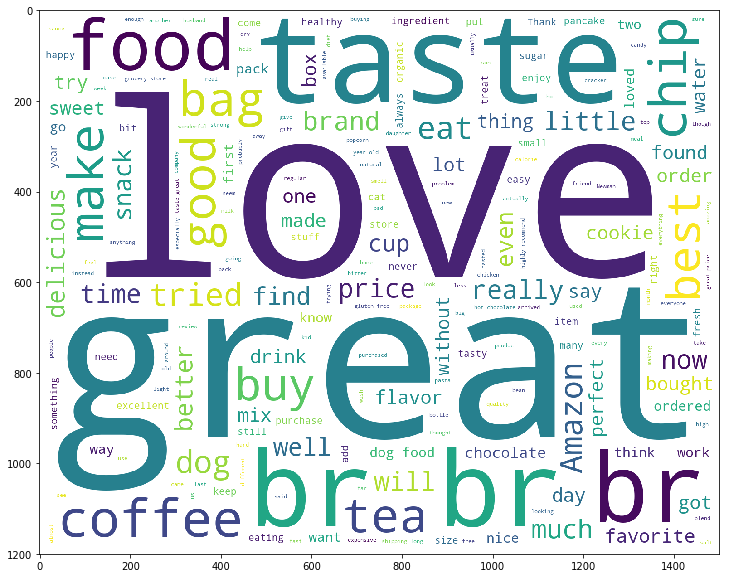

In [21]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

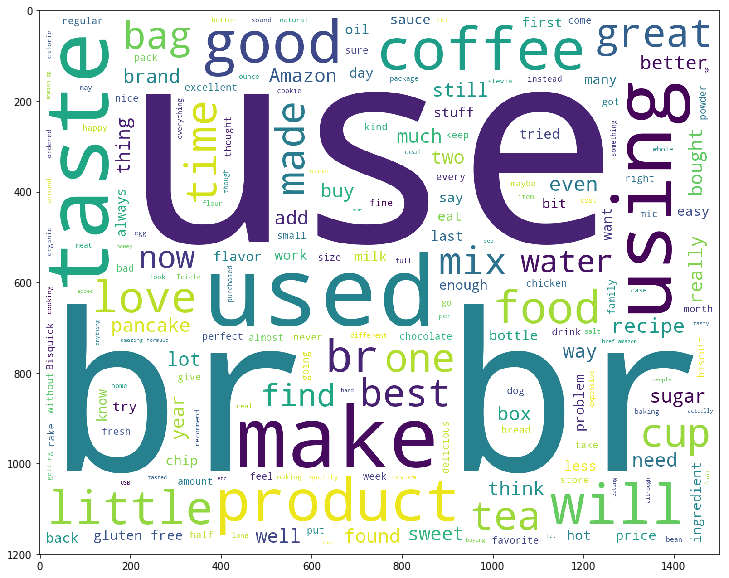

In [22]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

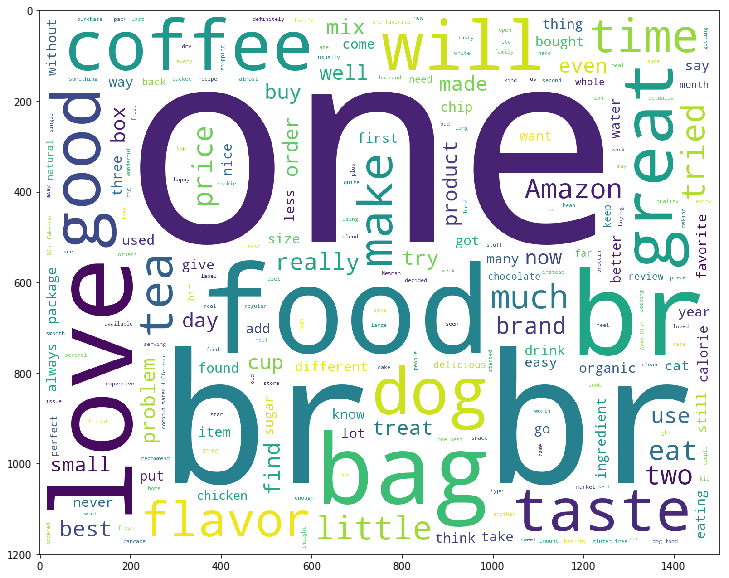

In [23]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

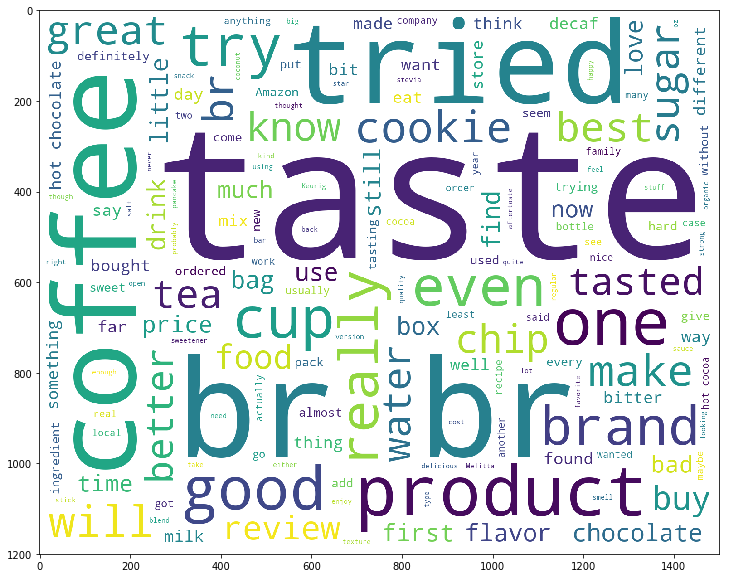

In [24]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

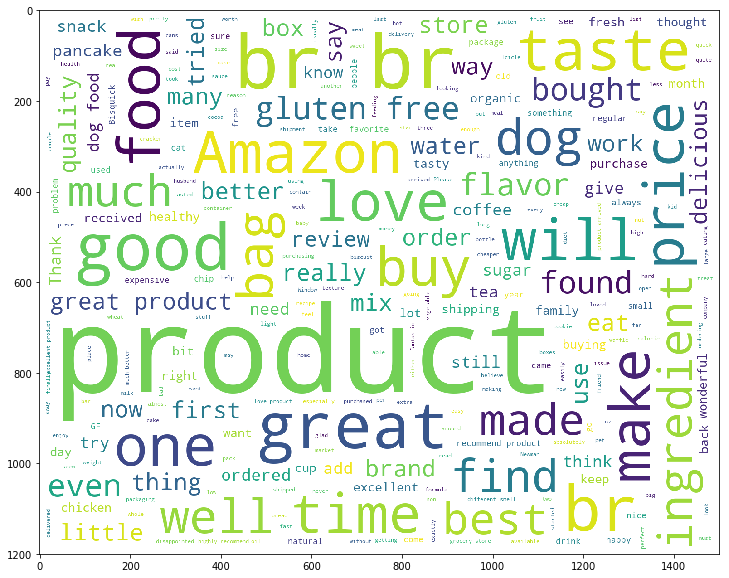

In [25]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

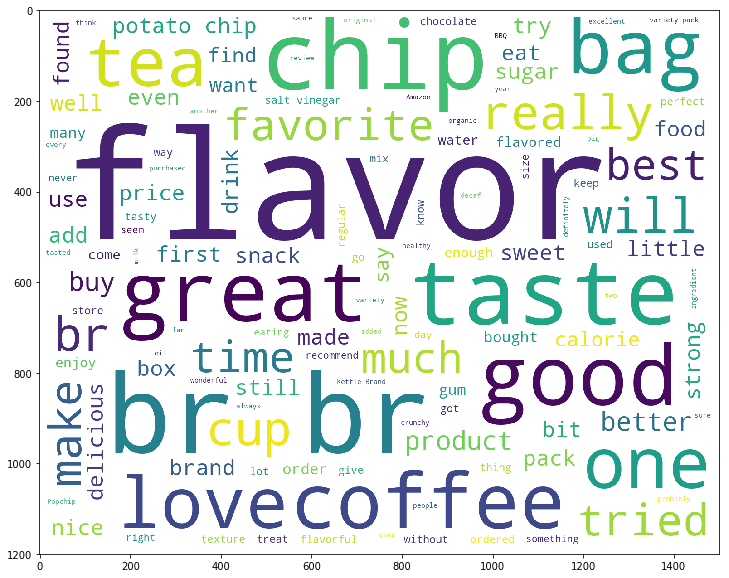

In [26]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster6))

plt.figure(figsize=(20,10))
plt.imshow(wc)

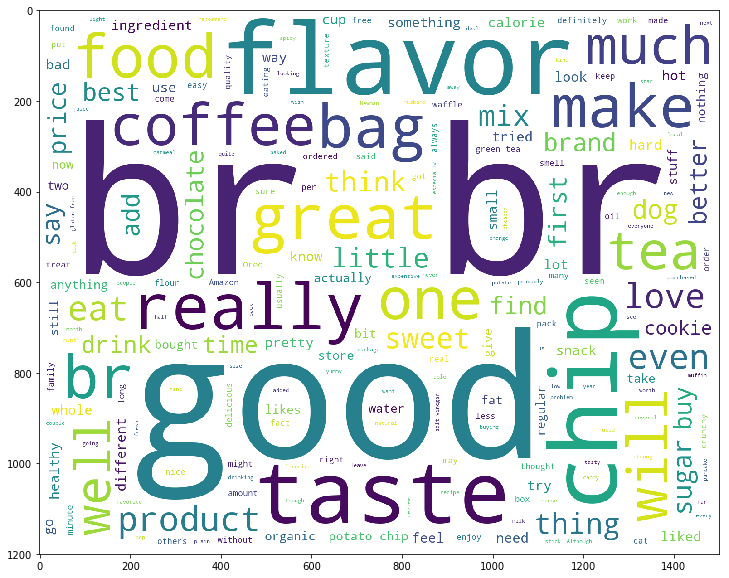

In [27]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster7))

plt.figure(figsize=(20,10))
plt.imshow(wc)

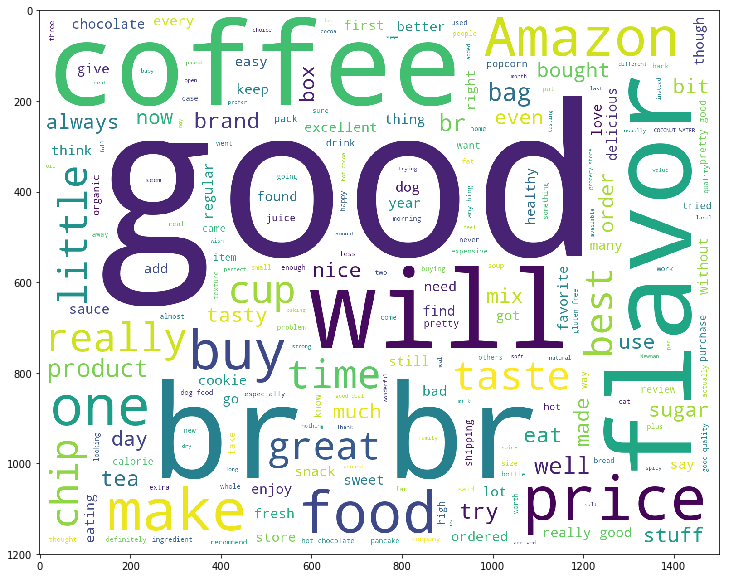

In [28]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster8))

plt.figure(figsize=(20,10))
plt.imshow(wc)

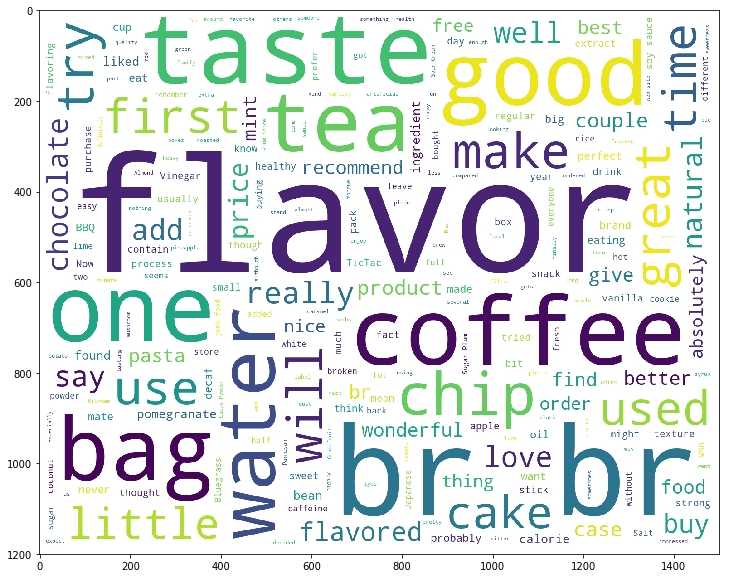

In [29]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster9))

plt.figure(figsize=(20,10))
plt.imshow(wc)

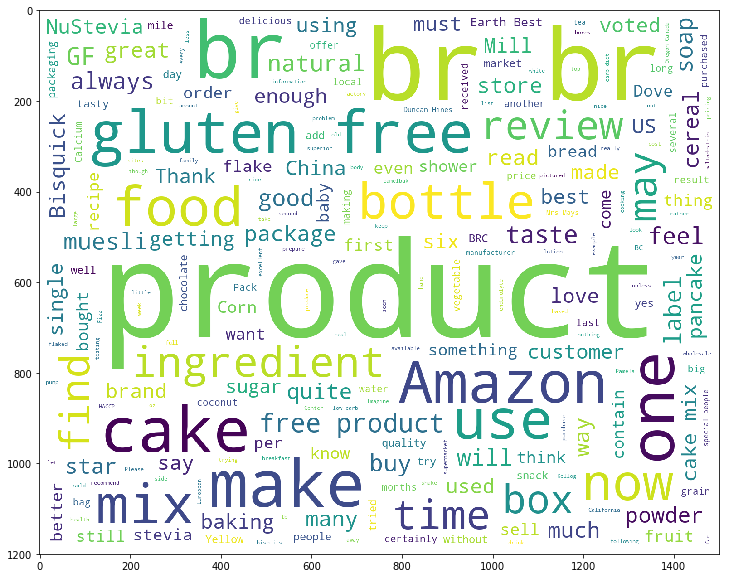

In [30]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster10))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [31]:
tf_idf_vect = TfidfVectorizer(min_df=100)
data = tf_idf_vect.fit_transform(x)


In [32]:
model = AgglomerativeClustering(n_clusters=2).fit(data.toarray())

reviews = final['Text'].values
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    else :
        cluster2.append(reviews[i])
 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))

No. of reviews in Cluster-1 :  465

No. of reviews in Cluster-2 :  4521


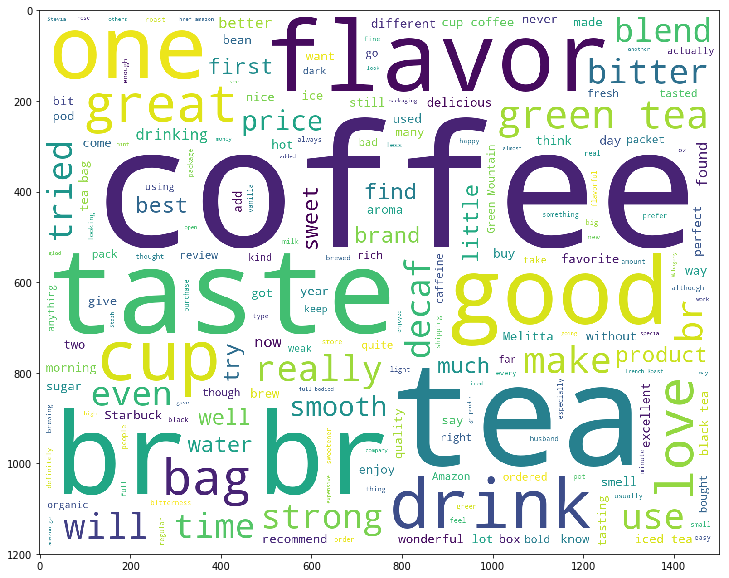

In [33]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

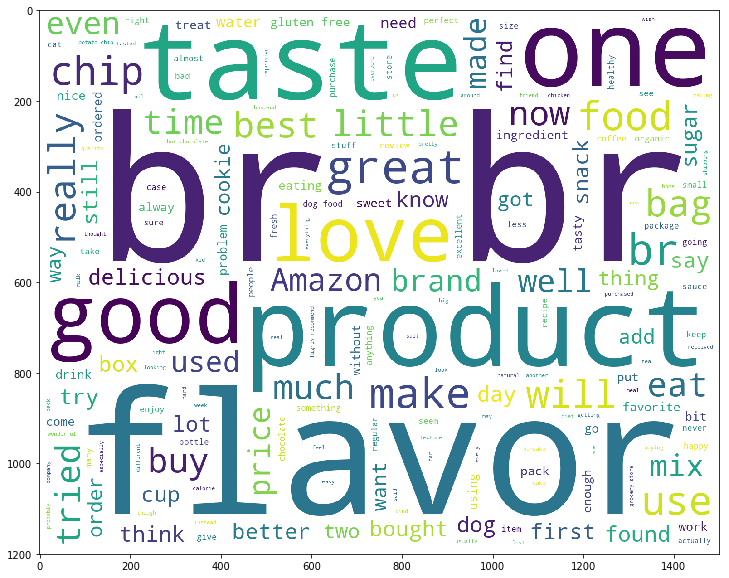

In [34]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [35]:
model = AgglomerativeClustering(n_clusters=5).fit(data.toarray())

# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    else :
        cluster5.append(reviews[i]) 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5))

No. of reviews in Cluster-1 :  3799

No. of reviews in Cluster-2 :  331

No. of reviews in Cluster-3 :  247

No. of reviews in Cluster-4 :  218

No. of reviews in Cluster-5 :  391


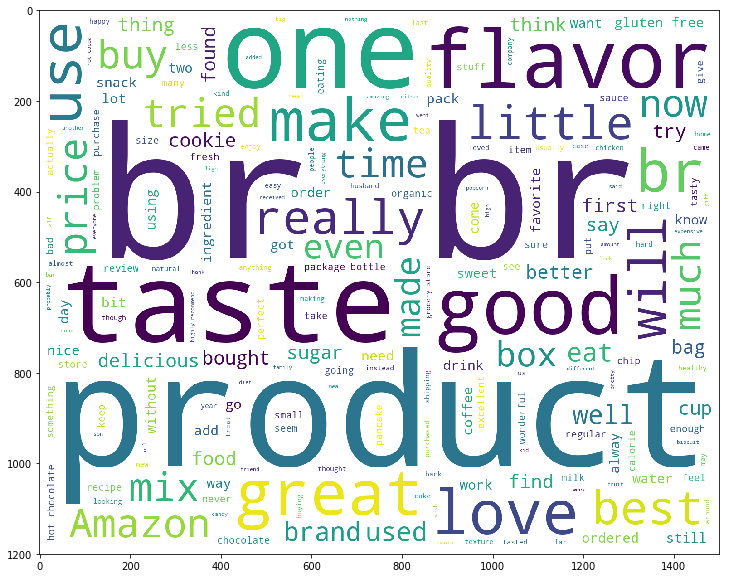

In [36]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

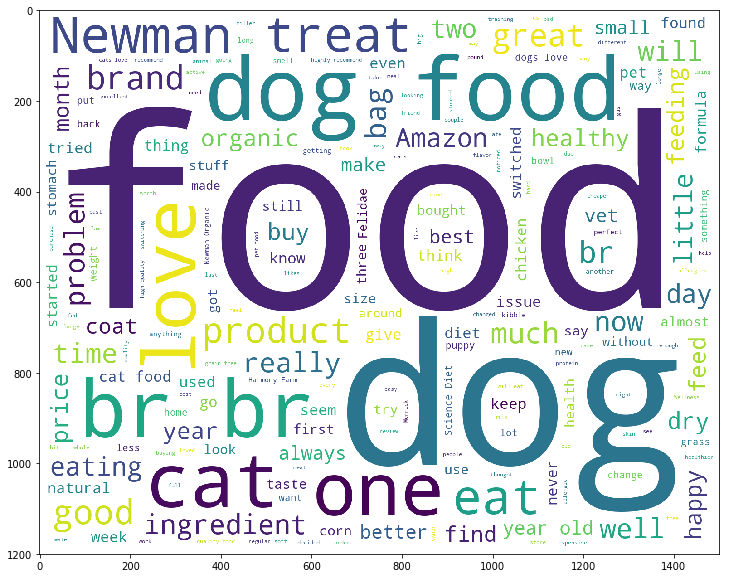

In [37]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

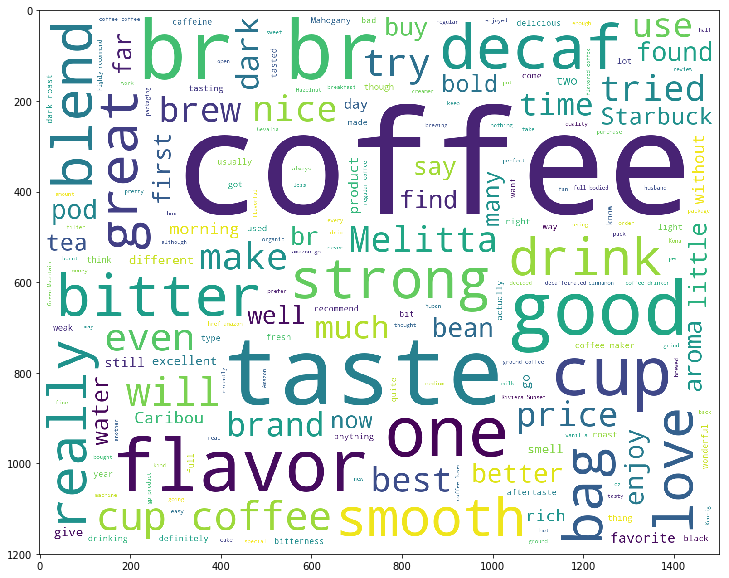

In [38]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

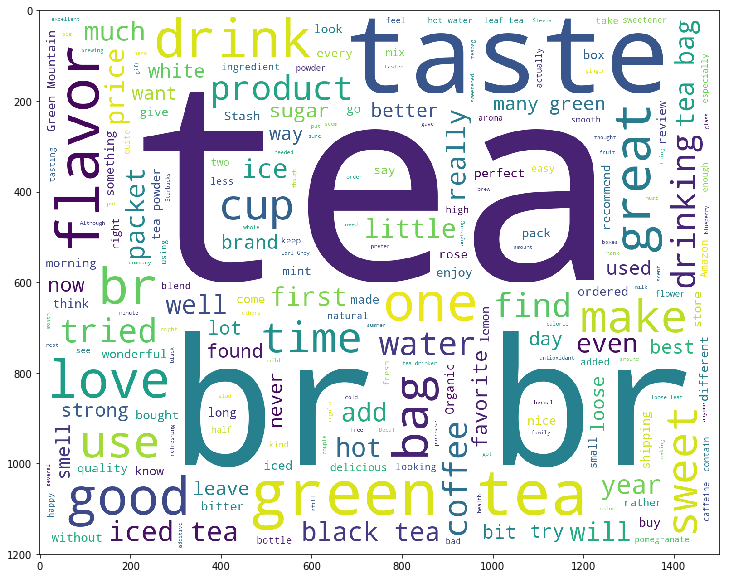

In [39]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

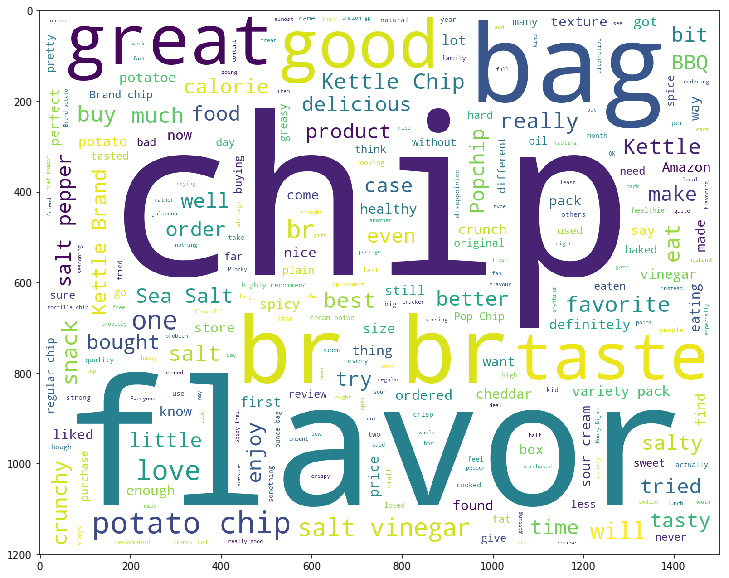

In [40]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [41]:
model = AgglomerativeClustering(n_clusters=10).fit(data.toarray())
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []
cluster10 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    elif model.labels_[i] == 4:
        cluster5.append(reviews[i])
    elif model.labels_[i] == 5:
        cluster6.append(reviews[i])
    elif model.labels_[i] == 6:
        cluster7.append(reviews[i])
    elif model.labels_[i] == 7:
        cluster8.append(reviews[i])
    elif model.labels_[i] == 8:
        cluster9.append(reviews[i])       
    else :
        cluster10.append(reviews[i])

In [42]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5)) 
print("\nNo. of reviews in Cluster-6 : ",len(cluster6))
print("\nNo. of reviews in Cluster-7 : ",len(cluster7))
print("\nNo. of reviews in Cluster-8 : ",len(cluster8))
print("\nNo. of reviews in Cluster-9 : ",len(cluster9))
print("\nNo. of reviews in Cluster-10 : ",len(cluster10))

No. of reviews in Cluster-1 :  173

No. of reviews in Cluster-2 :  3034

No. of reviews in Cluster-3 :  250

No. of reviews in Cluster-4 :  218

No. of reviews in Cluster-5 :  391

No. of reviews in Cluster-6 :  247

No. of reviews in Cluster-7 :  254

No. of reviews in Cluster-8 :  88

No. of reviews in Cluster-9 :  59

No. of reviews in Cluster-10 :  272


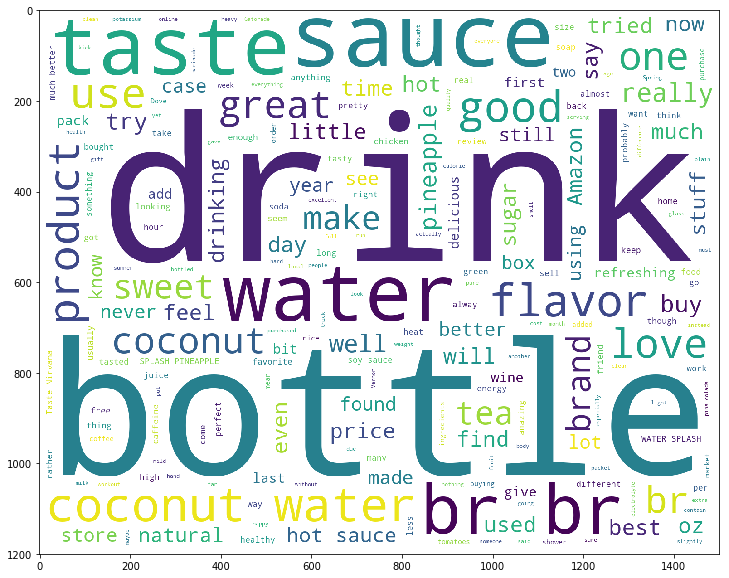

In [44]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

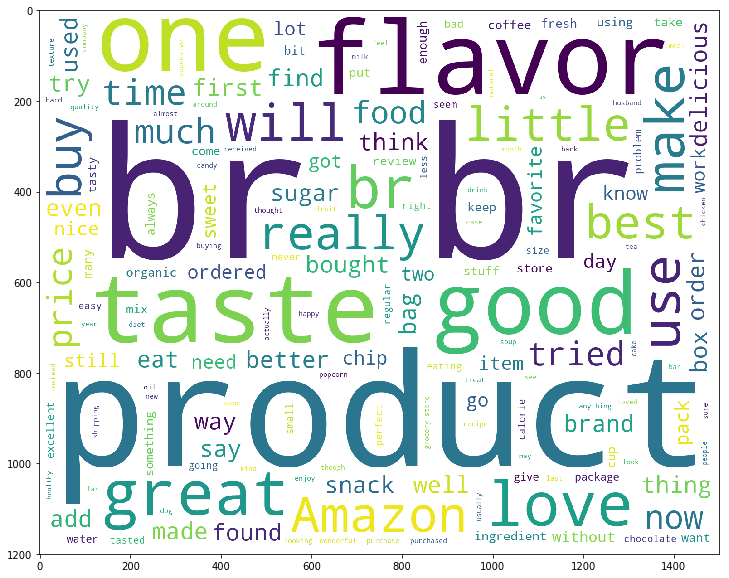

In [45]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

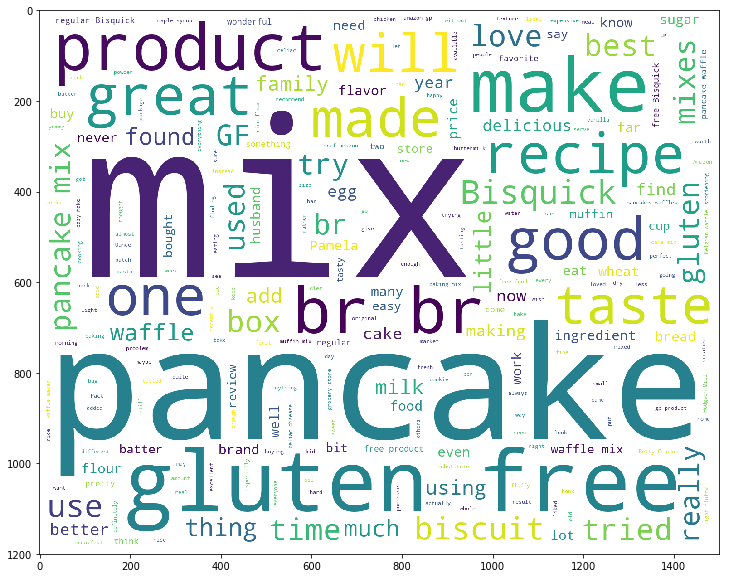

In [46]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

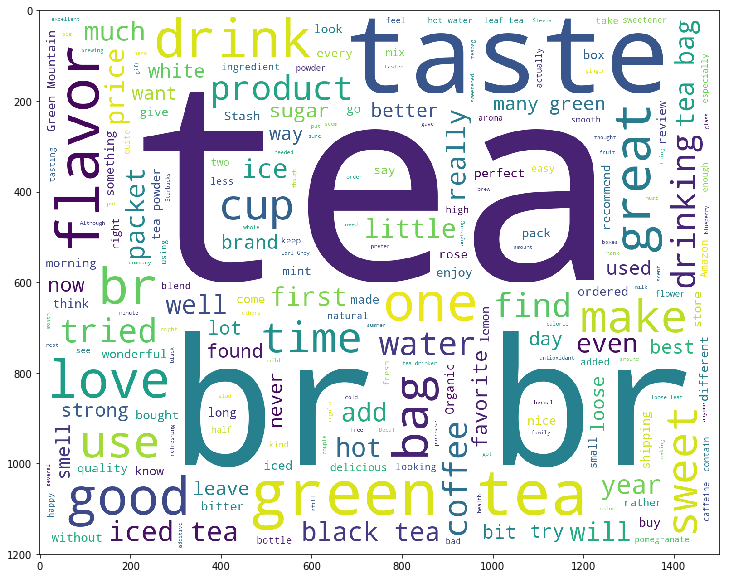

In [47]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

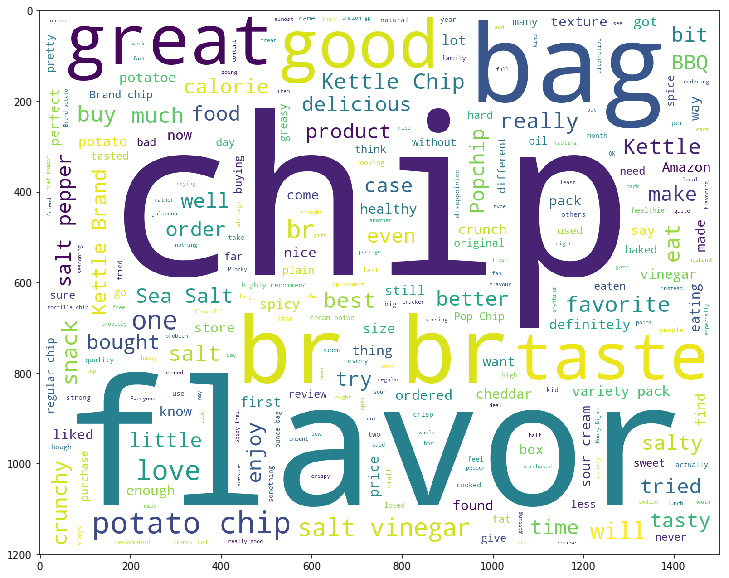

In [48]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

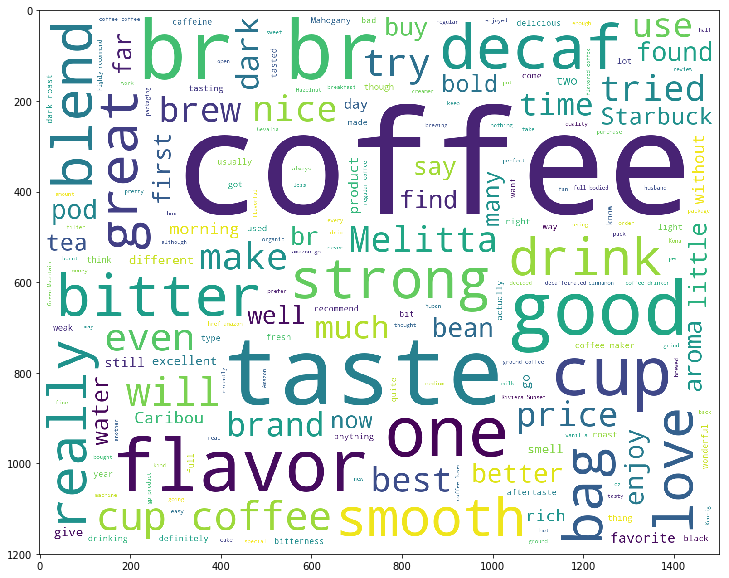

In [49]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster6))

plt.figure(figsize=(20,10))
plt.imshow(wc)

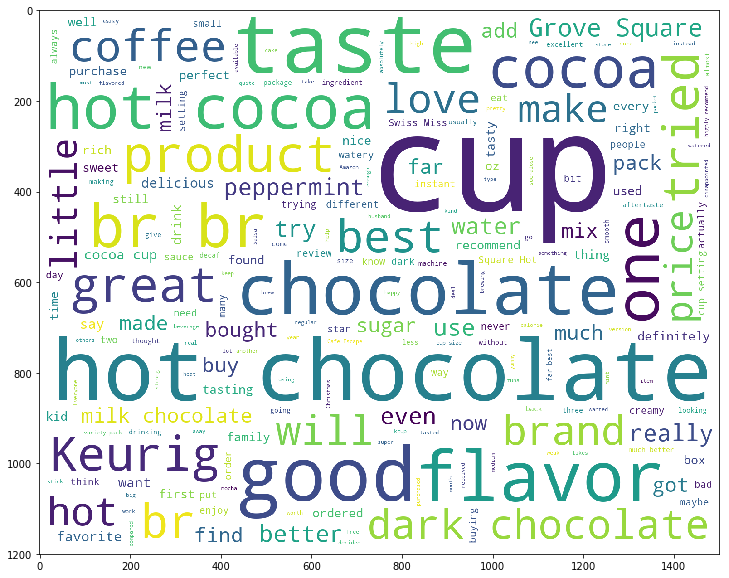

In [50]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster7))

plt.figure(figsize=(20,10))
plt.imshow(wc)

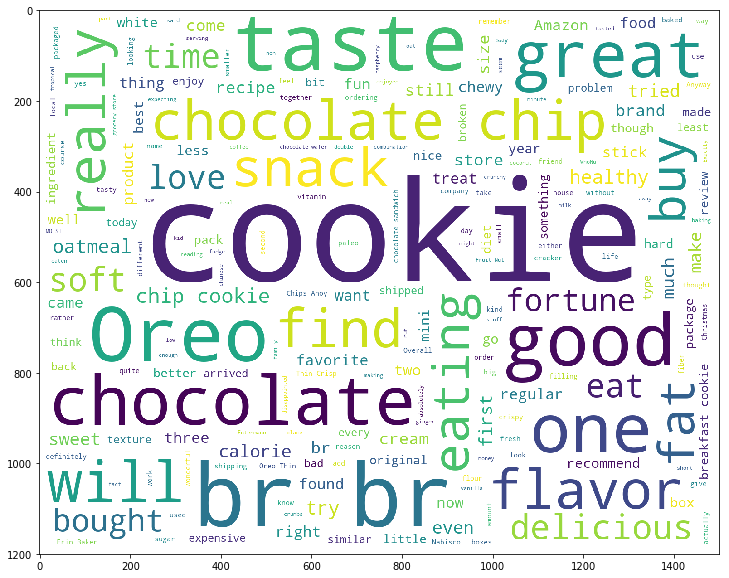

In [51]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster8))

plt.figure(figsize=(20,10))
plt.imshow(wc)

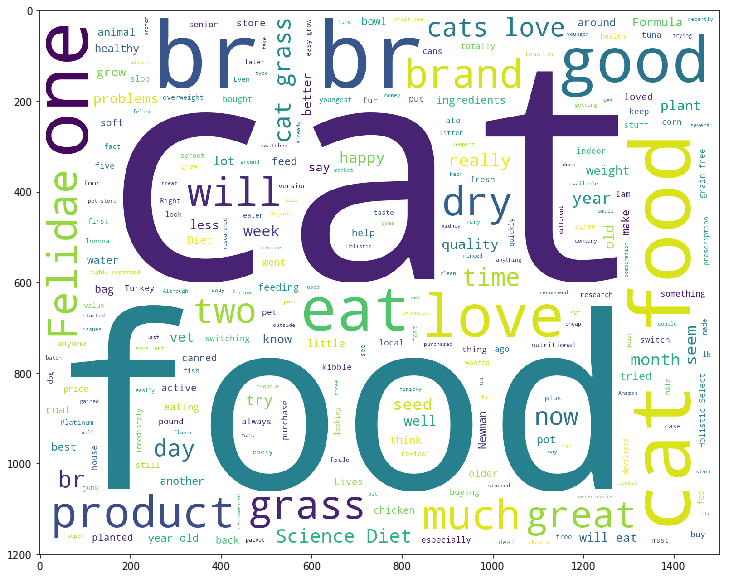

In [52]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster9))

plt.figure(figsize=(20,10))
plt.imshow(wc)

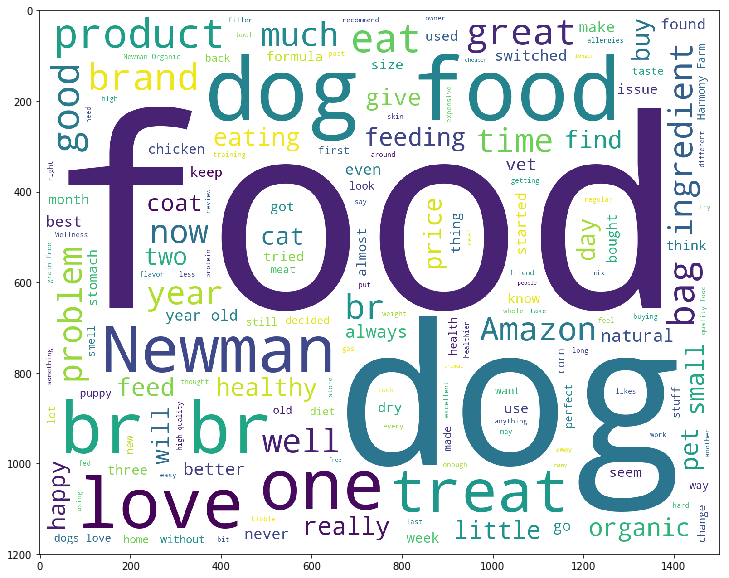

In [53]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster10))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [56]:
from sklearn.model_selection import train_test_split
X_train = final["Text"]

In [58]:
list_of_sent=[]
#for sent in final_40k['Text'].values:
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned
for sent in X_train:
    filtered_sentence=[]
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent.append(filtered_sentence)


In [59]:
import gensim
w2v_model=gensim.models.Word2Vec(list_of_sent,min_count=5,size=50, workers=4)

In [60]:
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
print(len(sent_vectors))
print(len(sent_vectors[0]))


4986
50


In [61]:
data = sent_vectors

In [62]:
model = AgglomerativeClustering(n_clusters=2).fit(data)

reviews = final['Text'].values
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    else :
        cluster2.append(reviews[i])
 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))

No. of reviews in Cluster-1 :  3593

No. of reviews in Cluster-2 :  1393


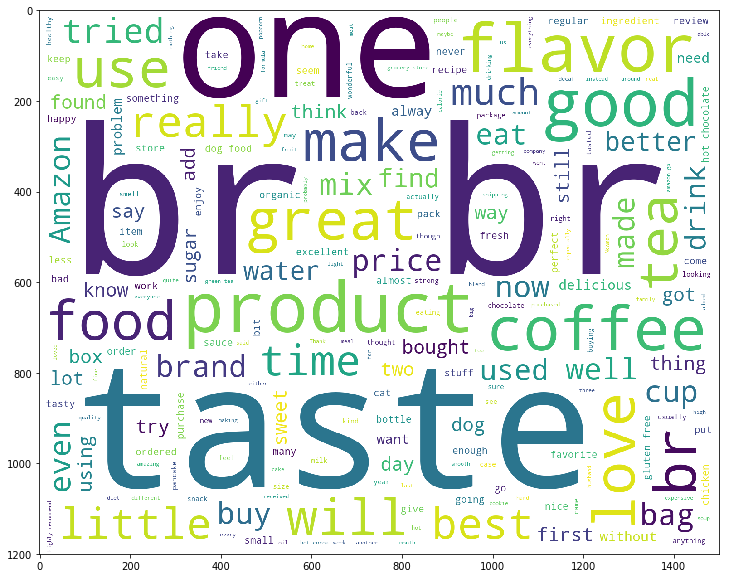

In [63]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

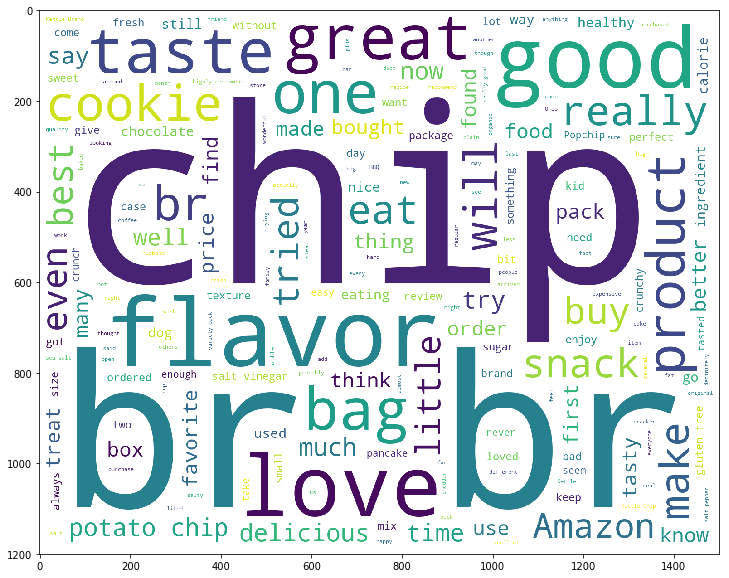

In [64]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [65]:
model = AgglomerativeClustering(n_clusters=5).fit(data)

# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    else :
        cluster5.append(reviews[i]) 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5))

No. of reviews in Cluster-1 :  2203

No. of reviews in Cluster-2 :  808

No. of reviews in Cluster-3 :  698

No. of reviews in Cluster-4 :  585

No. of reviews in Cluster-5 :  692


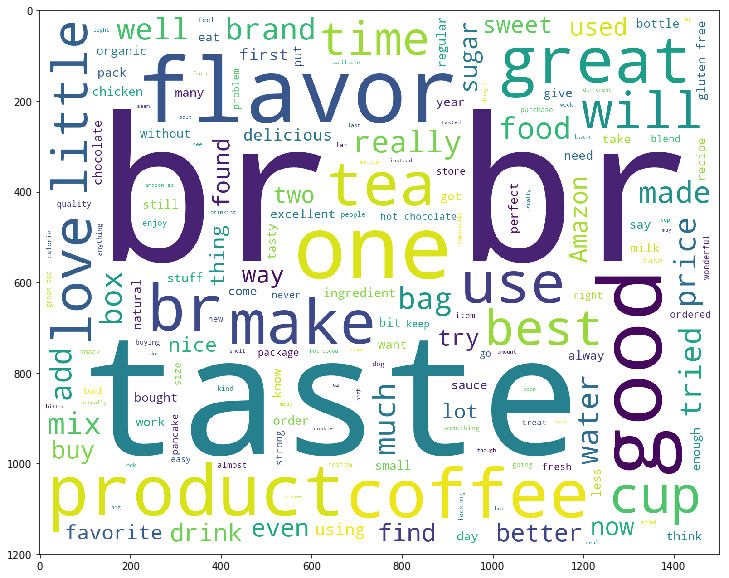

In [66]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

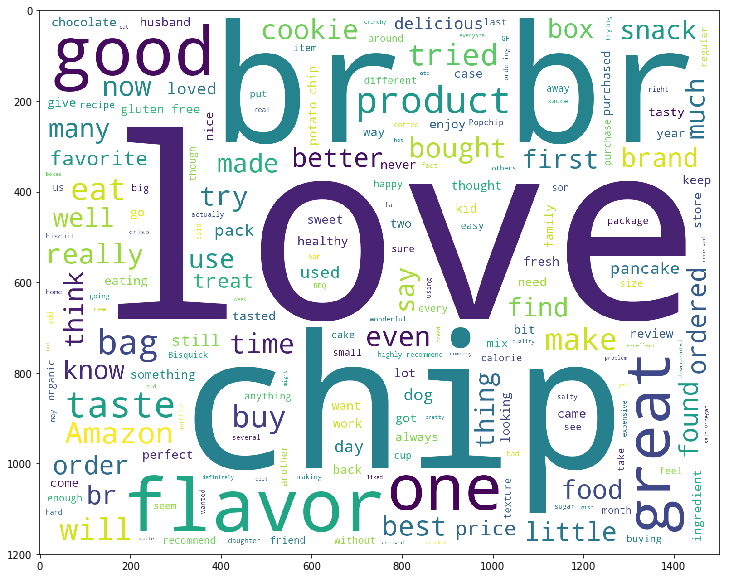

In [67]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

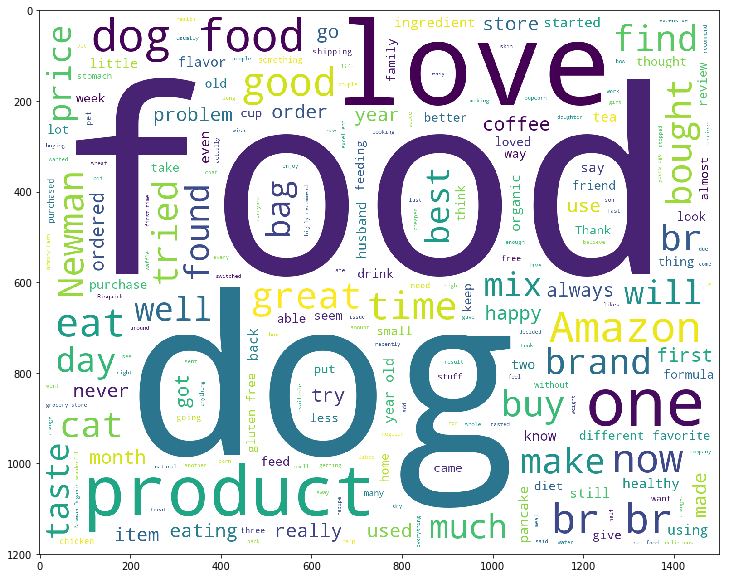

In [68]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

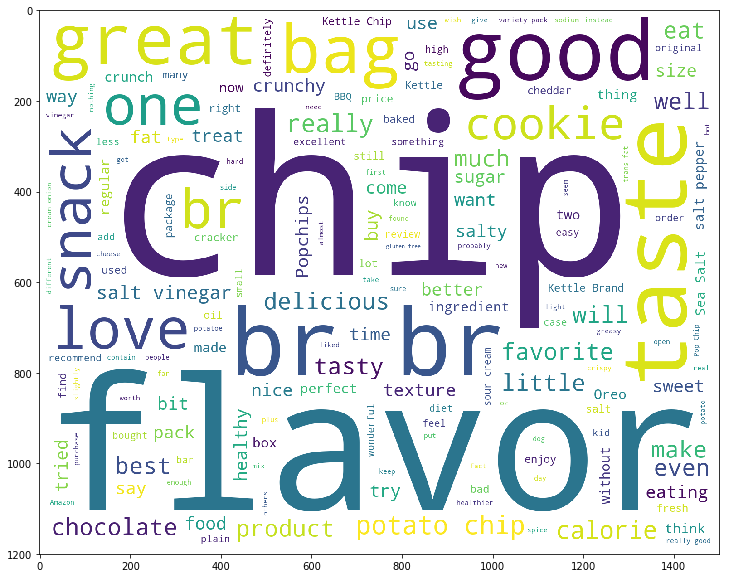

In [69]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

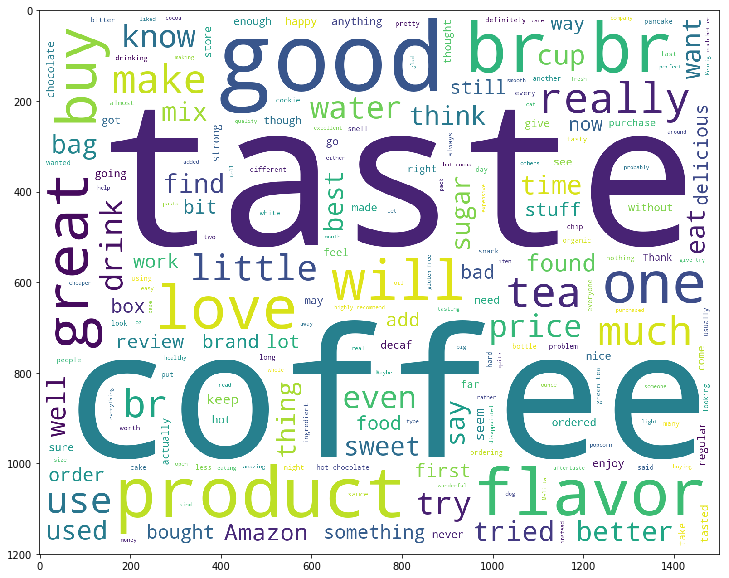

In [70]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [71]:
model = AgglomerativeClustering(n_clusters=10).fit(data)
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []
cluster10 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    elif model.labels_[i] == 4:
        cluster5.append(reviews[i])
    elif model.labels_[i] == 5:
        cluster6.append(reviews[i])
    elif model.labels_[i] == 6:
        cluster7.append(reviews[i])
    elif model.labels_[i] == 7:
        cluster8.append(reviews[i])
    elif model.labels_[i] == 8:
        cluster9.append(reviews[i])       
    else :
        cluster10.append(reviews[i])

In [72]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5)) 
print("\nNo. of reviews in Cluster-6 : ",len(cluster6))
print("\nNo. of reviews in Cluster-7 : ",len(cluster7))
print("\nNo. of reviews in Cluster-8 : ",len(cluster8))
print("\nNo. of reviews in Cluster-9 : ",len(cluster9))
print("\nNo. of reviews in Cluster-10 : ",len(cluster10))

No. of reviews in Cluster-1 :  1100

No. of reviews in Cluster-2 :  585

No. of reviews in Cluster-3 :  756

No. of reviews in Cluster-4 :  333

No. of reviews in Cluster-5 :  576

No. of reviews in Cluster-6 :  428

No. of reviews in Cluster-7 :  232

No. of reviews in Cluster-8 :  347

No. of reviews in Cluster-9 :  365

No. of reviews in Cluster-10 :  264


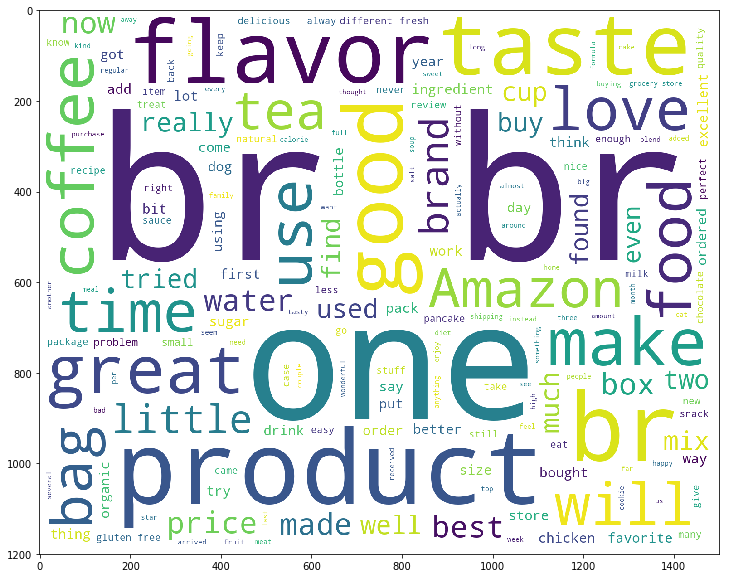

In [85]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

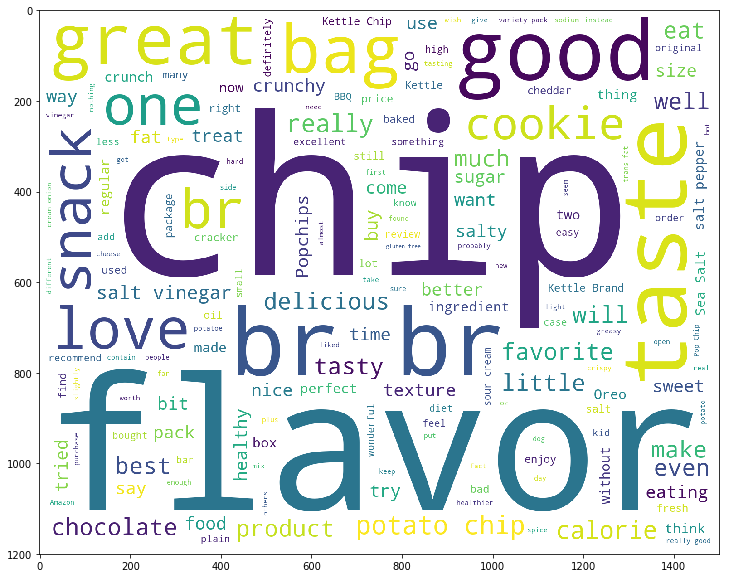

In [86]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

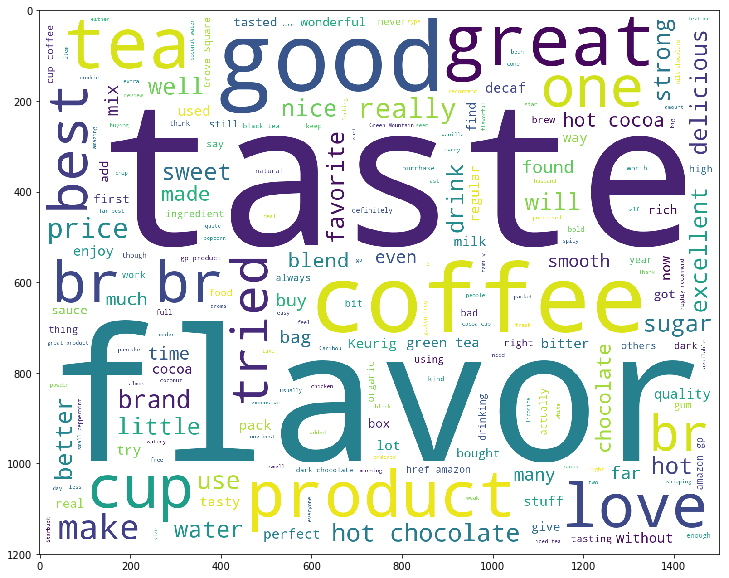

In [75]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

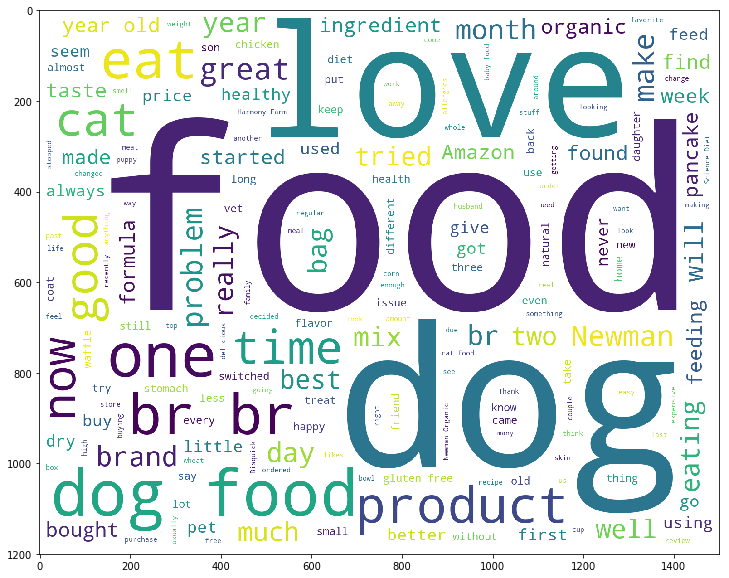

In [76]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

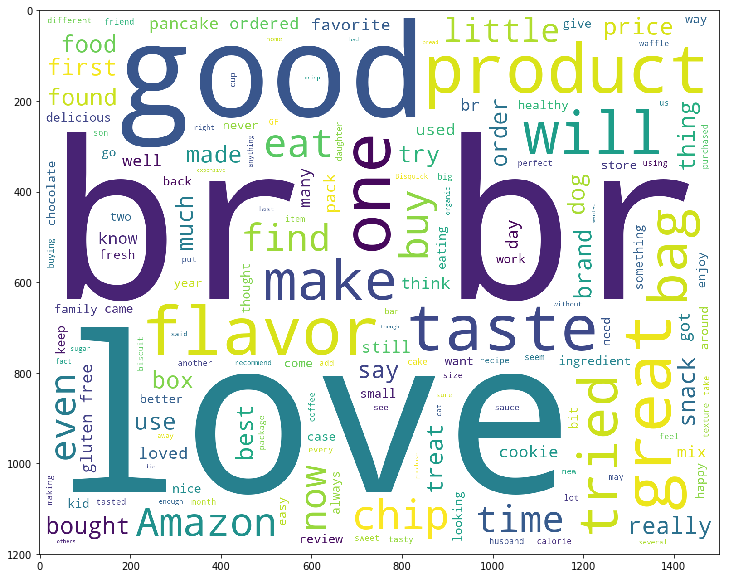

In [77]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

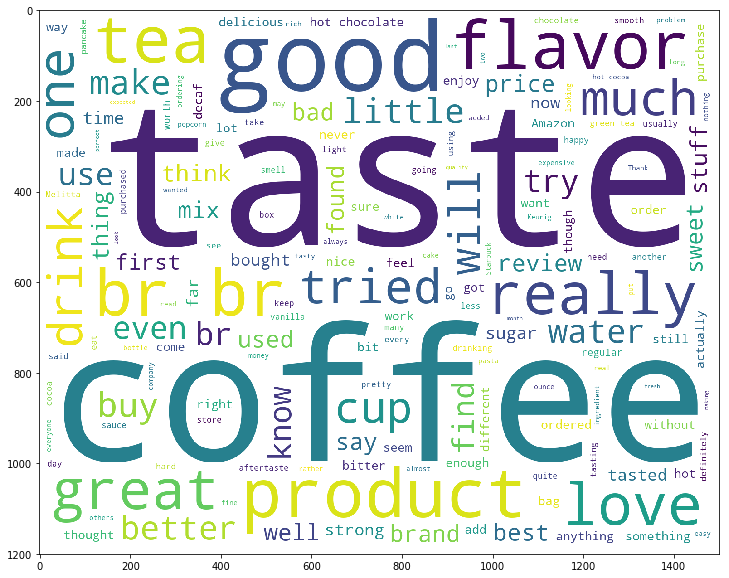

In [78]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster6))

plt.figure(figsize=(20,10))
plt.imshow(wc)

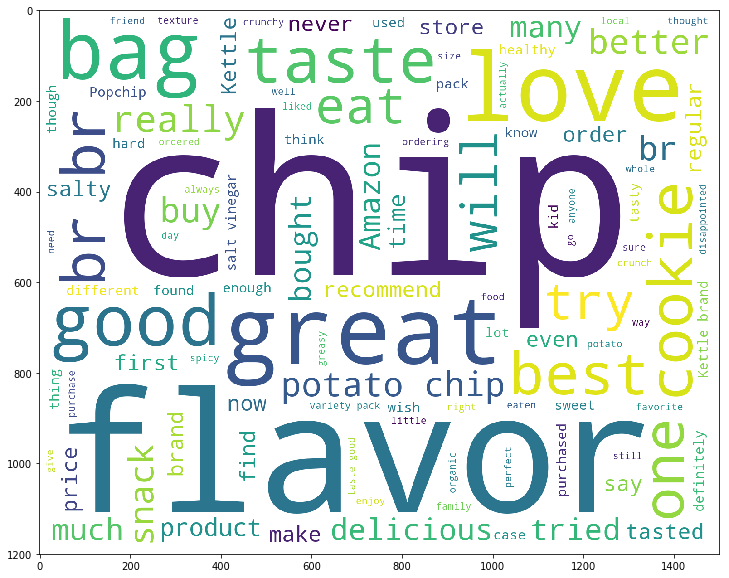

In [79]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster7))

plt.figure(figsize=(20,10))
plt.imshow(wc)

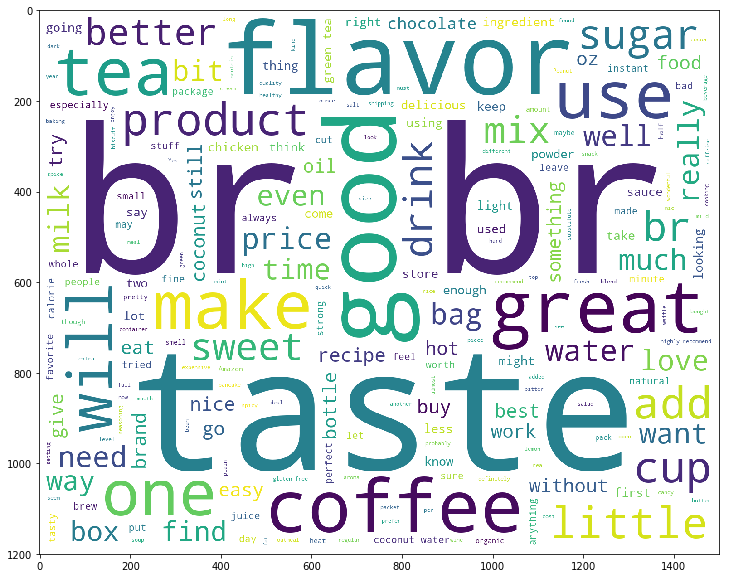

In [80]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster8))

plt.figure(figsize=(20,10))
plt.imshow(wc)

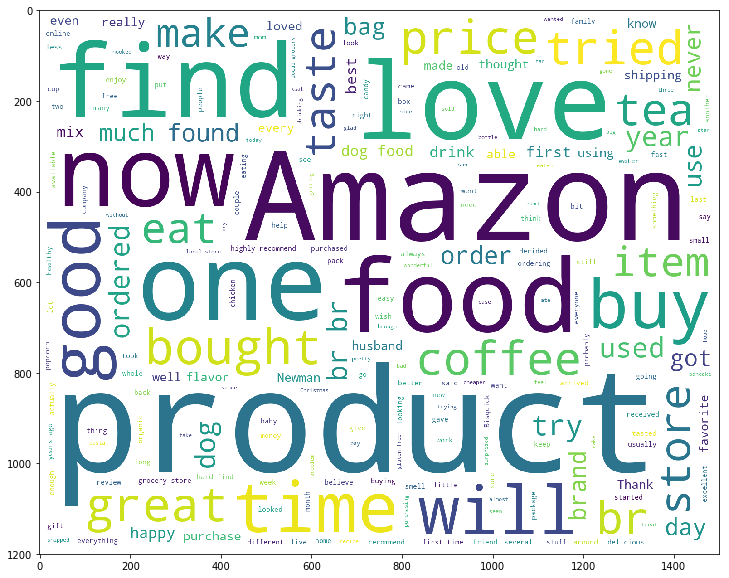

In [81]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster9))

plt.figure(figsize=(20,10))
plt.imshow(wc)

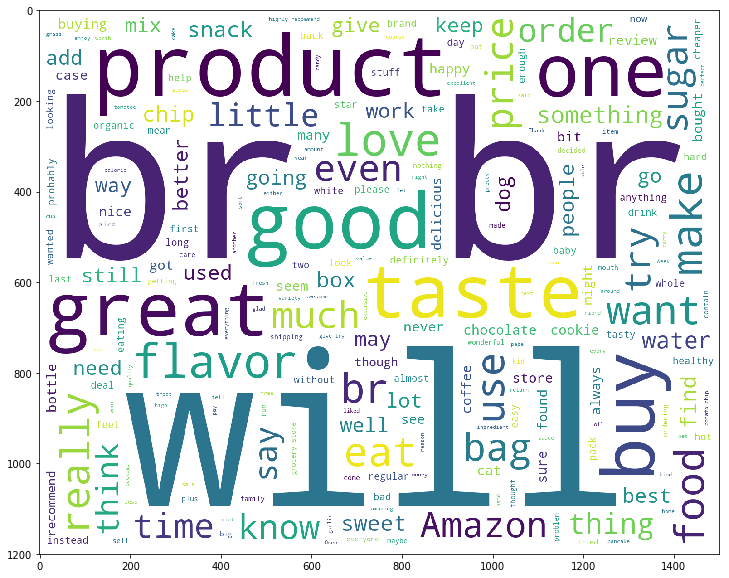

In [82]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster10))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [87]:
w2v_words = list(w2v_model.wv.vocab)
# TF-IDF weighted Word2Vec
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(final['CleanedText'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in list_of_sent: # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            # obtain the tf_idfidf of a word in a sentence/review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
        except:
            pass
    sent_vec /= weight_sum
    tfidf_sent_vectors.append(sent_vec)
    row += 1  

In [88]:
data=tfidf_sent_vectors

In [90]:
model = AgglomerativeClustering(n_clusters=2).fit(data)

reviews = final['Text'].values
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    else :
        cluster2.append(reviews[i])
 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))

No. of reviews in Cluster-1 :  4486

No. of reviews in Cluster-2 :  500


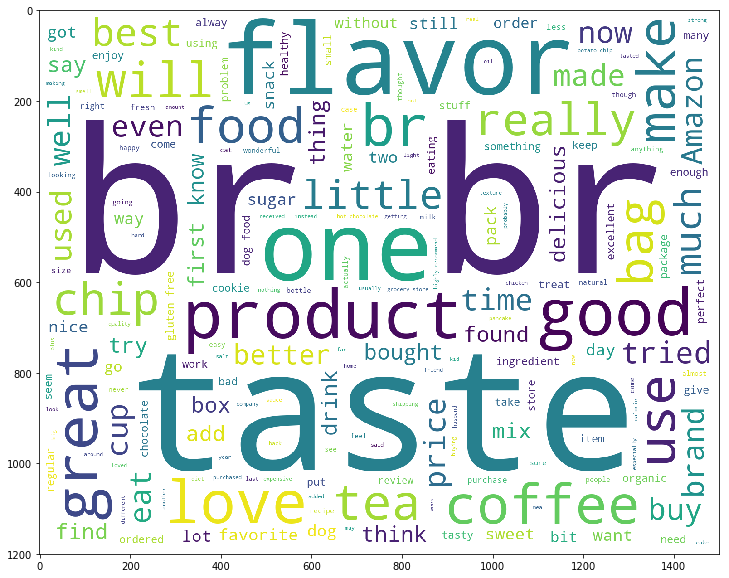

In [92]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

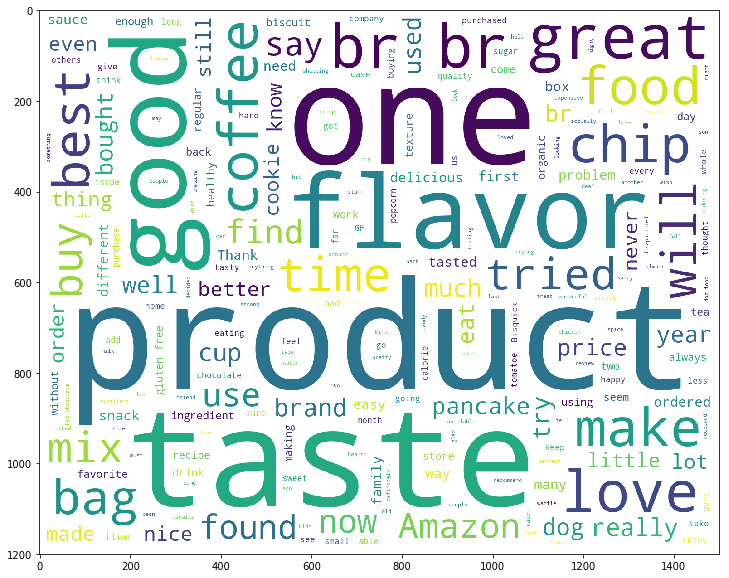

In [93]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [94]:
model = AgglomerativeClustering(n_clusters=5).fit(data)

# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    else :
        cluster5.append(reviews[i]) 
        
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(cluster1))
print("\nNo. of reviews in Cluster-2 : ",len(cluster2))
print("\nNo. of reviews in Cluster-3 : ",len(cluster3))
print("\nNo. of reviews in Cluster-4 : ",len(cluster4))
print("\nNo. of reviews in Cluster-5 : ",len(cluster5))

No. of reviews in Cluster-1 :  2032

No. of reviews in Cluster-2 :  500

No. of reviews in Cluster-3 :  1458

No. of reviews in Cluster-4 :  676

No. of reviews in Cluster-5 :  320


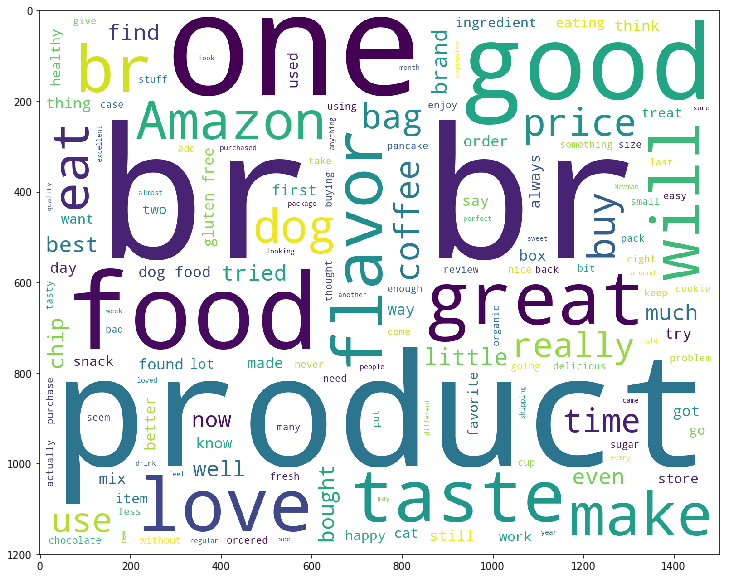

In [95]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

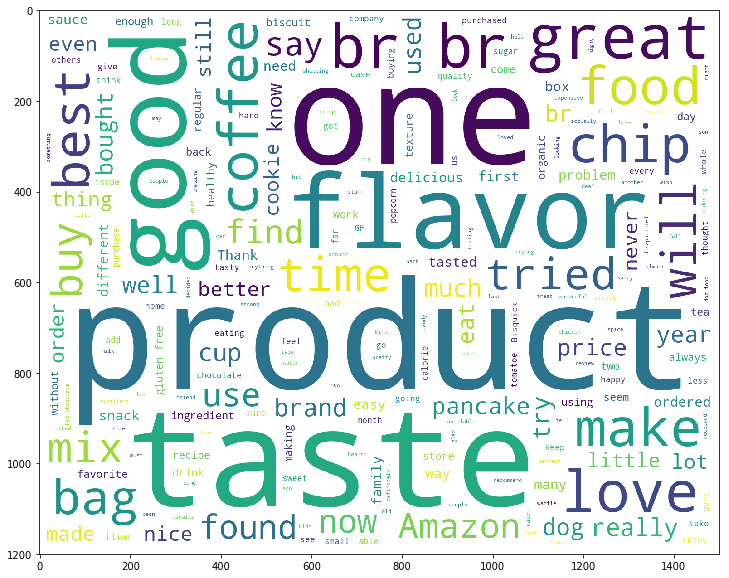

In [96]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

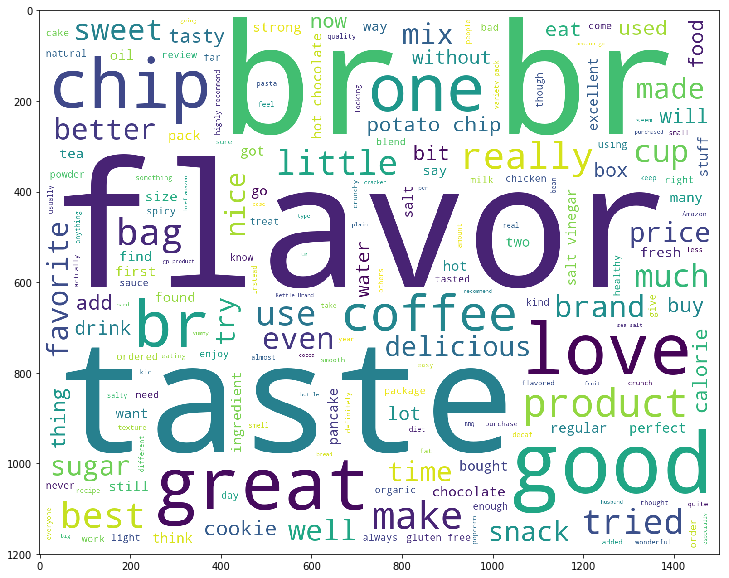

In [97]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

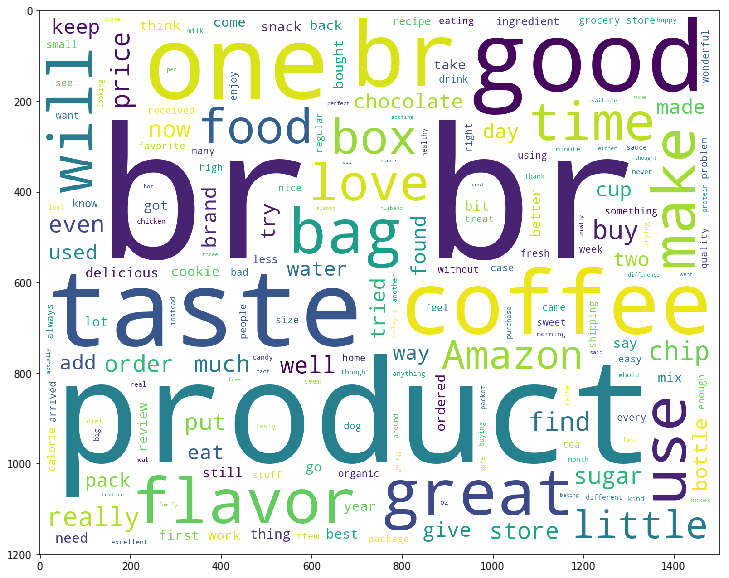

In [98]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

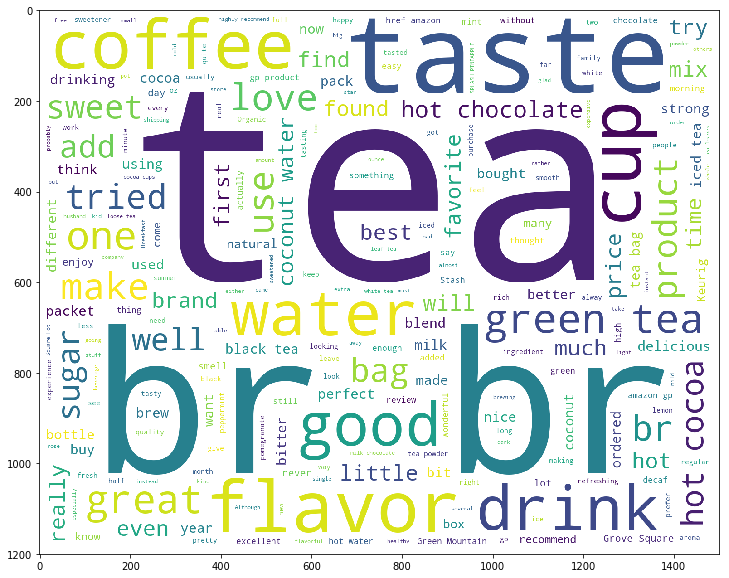

In [99]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

In [101]:
model = AgglomerativeClustering(n_clusters=10).fit(data)
# Getting all the reviews in different clusters
cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []
cluster10 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        cluster1.append(reviews[i])
    elif model.labels_[i] == 1:
        cluster2.append(reviews[i])
    elif model.labels_[i] == 2:
        cluster3.append(reviews[i])
    elif model.labels_[i] == 3:
        cluster4.append(reviews[i])
    elif model.labels_[i] == 4:
        cluster5.append(reviews[i])
    elif model.labels_[i] == 5:
        cluster6.append(reviews[i])
    elif model.labels_[i] == 6:
        cluster7.append(reviews[i])
    elif model.labels_[i] == 7:
        cluster8.append(reviews[i])
    elif model.labels_[i] == 8:
        cluster9.append(reviews[i])       
    else :
        cluster10.append(reviews[i])

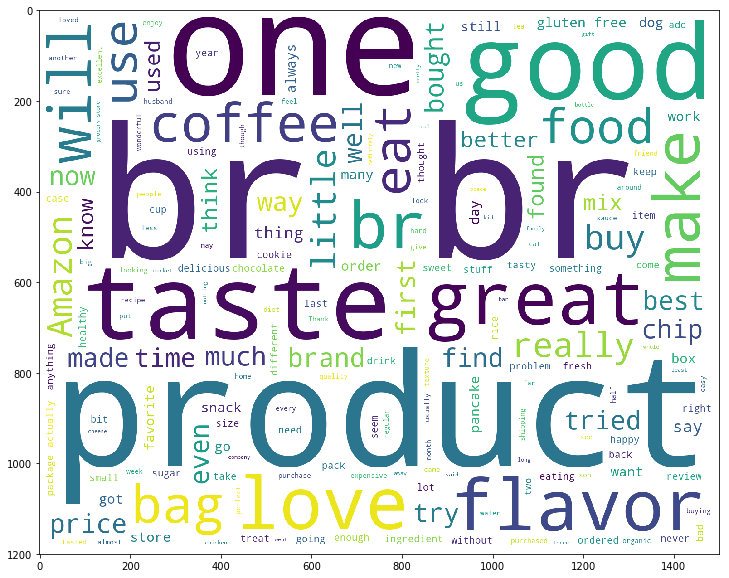

In [102]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster1))

plt.figure(figsize=(20,10))
plt.imshow(wc)

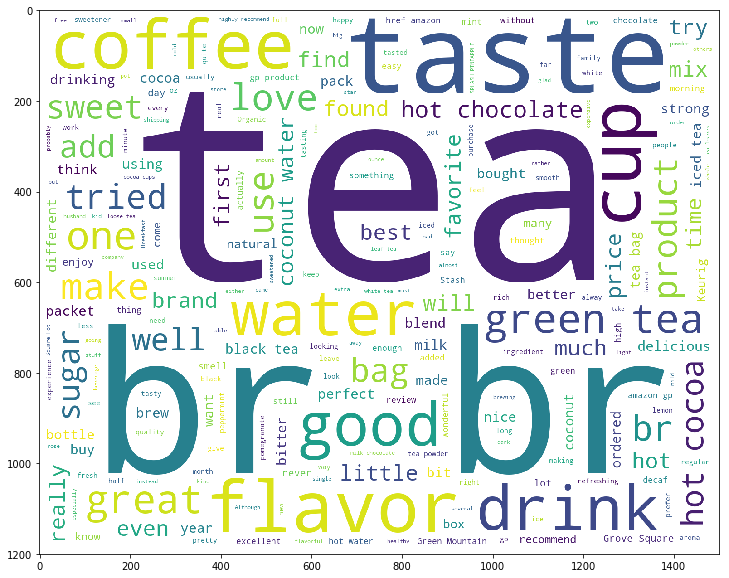

In [103]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster2))

plt.figure(figsize=(20,10))
plt.imshow(wc)

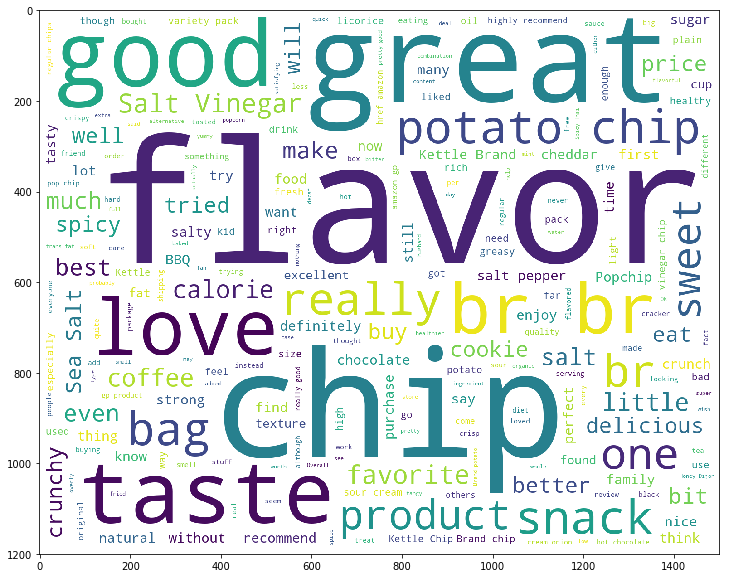

In [104]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster3))

plt.figure(figsize=(20,10))
plt.imshow(wc)

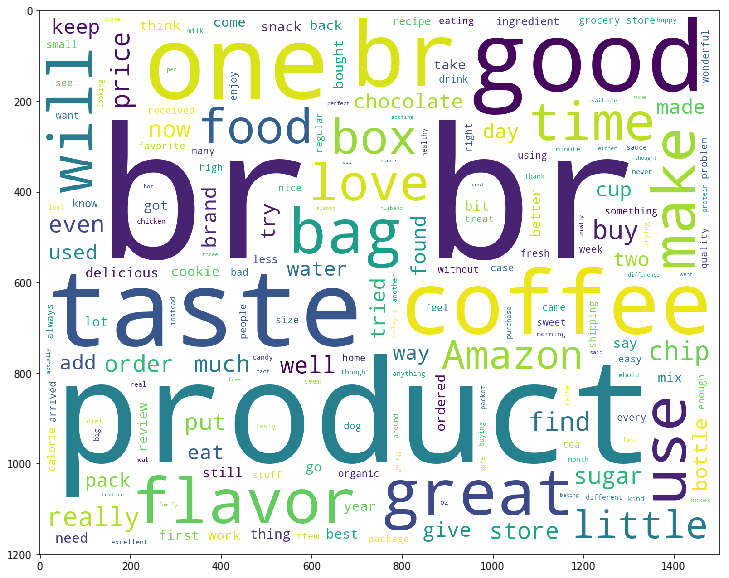

In [105]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster4))

plt.figure(figsize=(20,10))
plt.imshow(wc)

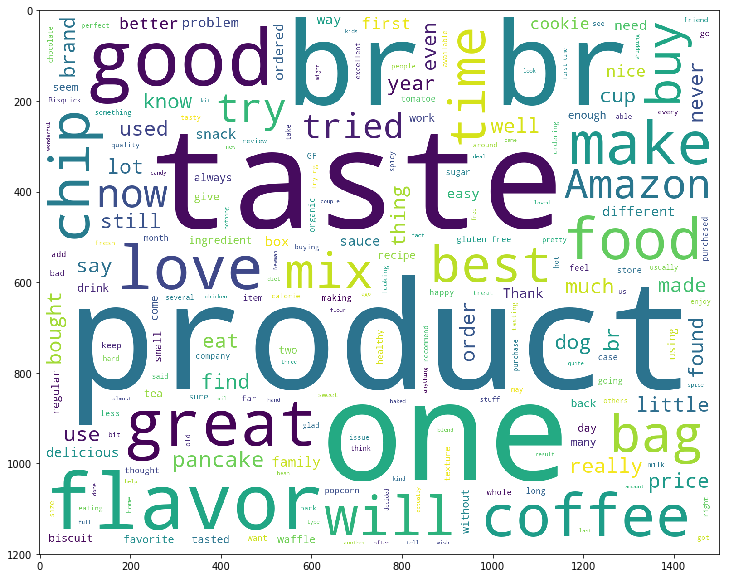

In [106]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster5))

plt.figure(figsize=(20,10))
plt.imshow(wc)

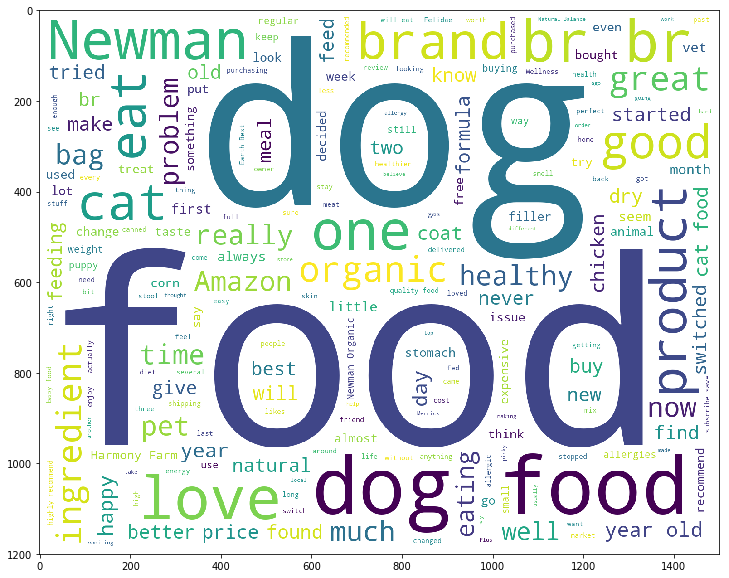

In [107]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster6))

plt.figure(figsize=(20,10))
plt.imshow(wc)

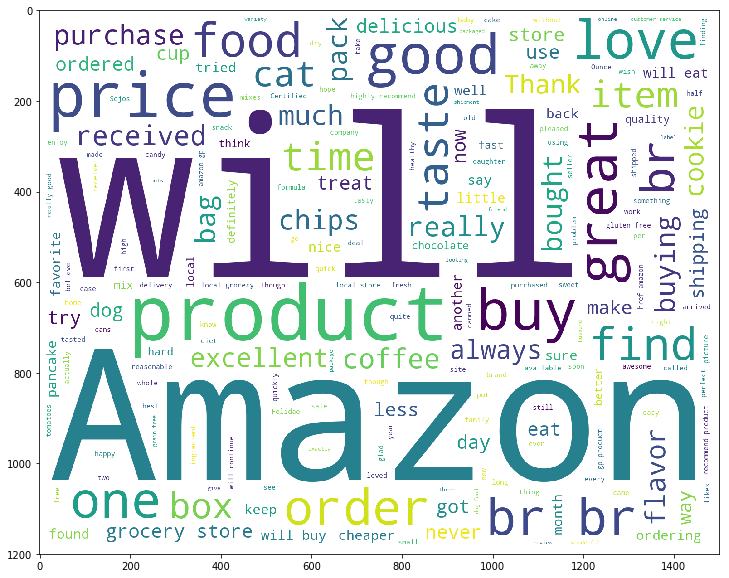

In [108]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster7))

plt.figure(figsize=(20,10))
plt.imshow(wc)

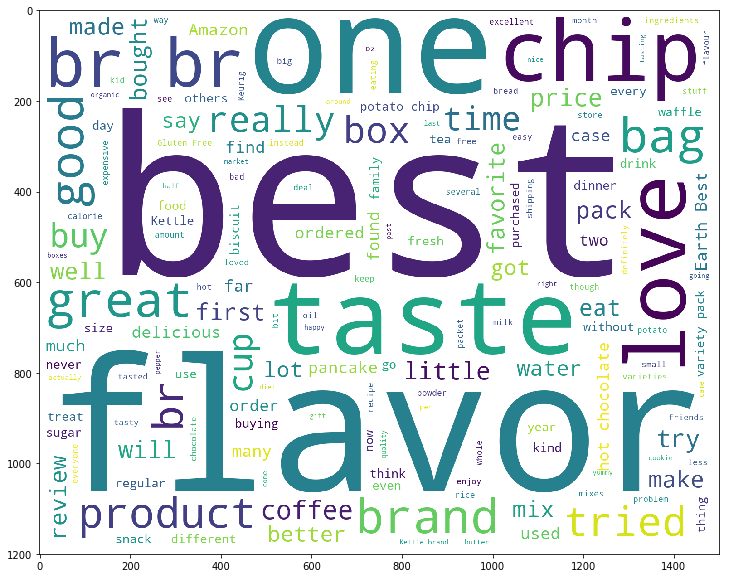

In [109]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster8))

plt.figure(figsize=(20,10))
plt.imshow(wc)

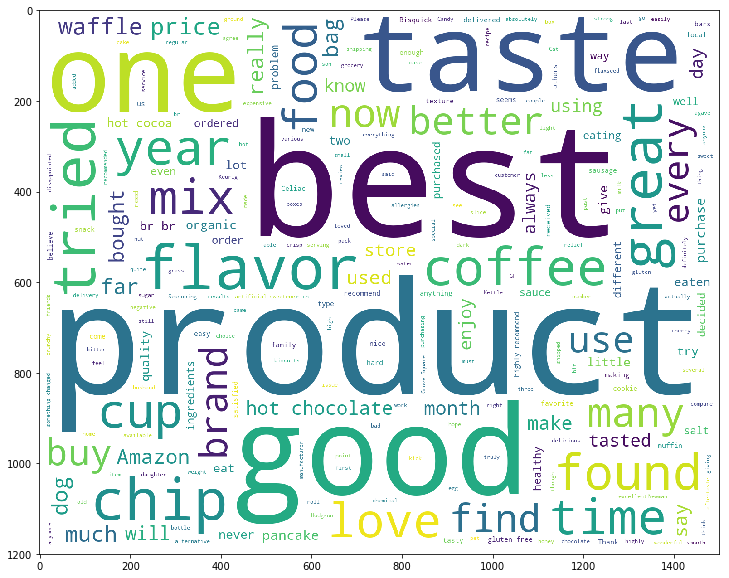

In [110]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster9))

plt.figure(figsize=(20,10))
plt.imshow(wc)

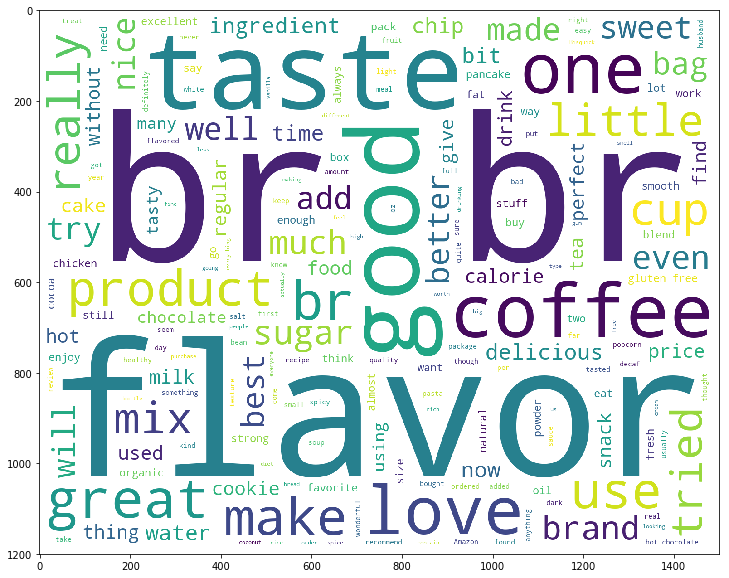

In [111]:
wc = WordCloud(max_words=1000, margin=10, background_color='white',
               scale=3, relative_scaling = 0.5, width=500, height=400,
               random_state=1).generate(' '.join(cluster10))

plt.figure(figsize=(20,10))
plt.imshow(wc)